In this notebook, we ran a ScopeBO scope for the ArBr dataset and compared it to the experimental clustering scope.

In [1]:
from pathlib import Path
import os
import sys

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
from matplotlib.lines import Line2D
import colorsys
import numpy as np
import pandas as pd

from rdkit import Chem
from rdkit.Chem import Draw

from scipy.cluster import hierarchy
from scipy.cluster.hierarchy import linkage, fcluster
from scipy.spatial.distance import cdist
import seaborn as sns
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import scale
from umap import UMAP
sys.path.append(os.path.abspath(os.path.join('..','..')))
from Code.benchmark import Benchmark
from Code.predictor import ScopeBO


# Doyle colors
doyle_colors = ["#CE4C6F", "#1561C2", "#188F9D","#C4ADA2","#515798", "#CB7D85", "#A9A9A9"]
# extension of palette with lighter and darker versions
def adjust_lightness(color, factor=1.2):
    """
    Function to make colors lighter (factor > 1) or darker (factor < 1).
    """
    r, g, b = mcolors.to_rgb(color)
    h, l, s = colorsys.rgb_to_hls(r, g, b)
    l = max(0, min(1, l * factor))
    r, g, b = colorsys.hls_to_rgb(h, l, s)
    return mcolors.to_hex((r, g, b))

lighter = [adjust_lightness(c, 1.2) for c in doyle_colors]
darker  = [adjust_lightness(c, 0.7) for c in doyle_colors]
all_colors = doyle_colors + darker[::-1] + lighter[::-1] 

# Save the categorical colormap
cat_cmap = ListedColormap(all_colors, name="Doyle_cat")
plt.colormaps.register(cat_cmap)

# Define and save a continuous colormap
colors = [doyle_colors[1],"#FFFFFFD1",doyle_colors[0]]
cont_cmap = LinearSegmentedColormap.from_list("Doyle_cont", colors)
plt.colormaps.register(cont_cmap)

wdir = Path(".")

# General plt parameters
plt.rcParams.update({
    "axes.titlesize": 20,        # Subplot title
    "axes.labelsize": 16,        # X and Y labels
    "figure.titlesize": 24,      # Suptitle
    "xtick.labelsize": 14,       # X tick labels
    "ytick.labelsize": 14,       # Y tick labels
    "legend.fontsize": 14,       # Legend text
    "legend.title_fontsize": 14  # Legend titles
})

# Scope score definition

In order to calculate scope scores for this dataset, we first established objective bounds for the normalization of them using the workflow established in the hyperparameter optimization for the ArI oxidative addtion dataset.

In [2]:
# Read in the labelled dataset and scale it
df_labelled = pd.read_csv(f"./arbr_dset.csv", index_col=0,header=0)
df_data = df_labelled.copy(deep=True)
df_data = df_data.drop(columns=['yield'])  # drop the objective values
df_data = pd.DataFrame(scale(df_data),df_data.index,df_data.columns)
objectives = ["yield"]
wdir = Path(".")

# Make a UMAP for visualization of the results
fit = UMAP(n_neighbors=40,min_dist=0.7,n_components=2,metric="euclidean",random_state=12)
df_umap = pd.DataFrame(fit.fit_transform(df_data),df_data.index,["UMAP1","UMAP2"])
df_umap.to_csv("arbr_UMAP_coords.csv")


In [3]:
# # Low vendi and high objective bounds with the greedy acquisition function without pruning
# # NOTE: batch size 2 failed due to numerical instabilities for one of the random seeds
# run_settings = {1: 0, 3: 0, 4: 0}

# for batch_size in run_settings.keys():
#     Benchmark().collect_data(
#         filename_labelled = f"./arbr_dset.csv",
#         name_results = f"./Results_Data/bounds/greedy40_b{batch_size}",
#         objectives=['yield'],
#         budget = 40,
#         batches= [batch_size],
#         Vendi_pruning_fractions = [run_settings[batch_size]],
#         seeds = 40,
#         acquisition_function_mode= "greedy",
#         pruning_metric= "vendi_batch",
#         init_sampling_method="random")

In [4]:
# # High vendi and low objective bounds with the explorative acquisition function with max pruning for the respective batch size
# # NOTE: batch size 2 failed because of numerical instability in one of the runs
# run_settings = {1: 13, 3: 36, 4: 46}

# for batch_size in run_settings.keys():
#     Benchmark().collect_data(
#         filename_labelled = f"./arbr_dset.csv",
#         name_results = f"./Results_Data/bounds/explorative40_b{batch_size}",
#         objectives=['yield'],
#         budget = 40,
#         batches= [batch_size],
#         Vendi_pruning_fractions = [run_settings[batch_size]],
#         seeds = 40,
#         acquisition_function_mode= "explorative",
#         pruning_metric= "vendi_batch",
#         init_sampling_method="random")

Get the objective and Vendi score bounds by analyzing the scopes

In [5]:
# Use the results of the greedy acqusition function (no pruning) with scope size 40, to get the upper bounds for the yield 
# and the vendi score.
dfs_bounds_greedy = {}
for metric in ["yield","vendi"]:
    dfs_metric = {}
    for batch_size in [1,3,4]:
        dfs_metric[batch_size] = Benchmark().heatmap_plot(type_results=metric,name_results=f"./Results_Data/bounds/greedy40_b{batch_size}",budget=40,show_plot=False)
    greedy_values = pd.concat(dfs_metric,axis=1)
    greedy_values.columns = [1,3,4]
    greedy_values = greedy_values.stack().reset_index(drop=True)
    dfs_bounds_greedy[metric] = pd.DataFrame({metric: greedy_values})
bounds_greedy = pd.concat(dfs_bounds_greedy,axis=1)
bounds_greedy.columns = ["yield","vendi"]
yield_max = bounds_greedy["yield"].max()
vendi_min = bounds_greedy["vendi"].min()
print(f"upper bounds yield: {yield_max}")
print(f"lower bounds vendi score: {vendi_min}")

upper bounds yield: 60.25691937316729
lower bounds vendi score: 1.5966915696066428


In [6]:
# Use the results of the explorative acqusition function (max pruning) with scope size 40, to get the lower bounds for the yield 
# and the upper bounds for the vendi score.
dfs_bounds_explorative = {}
for metric in ["yield","vendi"]:
    dfs_metric = {}
    for batch_size in [1,3,4]:
        dfs_metric[batch_size] = Benchmark().heatmap_plot(type_results=metric,
                                                          name_results=f"./Results_Data/bounds"\
                                                            f"/explorative40_b{batch_size}",
                                                            budget=40,show_plot=False)
    explorative_values = pd.concat(dfs_metric,axis=1)
    explorative_values.columns = [1,3,4]
    explorative_values = explorative_values.stack().reset_index(drop=True)
    dfs_bounds_explorative[metric] = pd.DataFrame({metric: explorative_values})
bounds_explorative = pd.concat(dfs_bounds_explorative,axis=1)
bounds_explorative.columns = ["yield","vendi"]
yield_min = bounds_explorative["yield"].min()
vendi_max = bounds_explorative["vendi"].max()
print(f"lower bounds yield: {yield_min}")
print(f"upper bounds vendi score: {vendi_max}")

lower bounds yield: 30.465668016857883
upper bounds vendi score: 6.05675840987693


In [7]:
# Record the bounds
yield_bounds = (yield_max,yield_min)
vendi_bounds = (vendi_max,vendi_min)
bounds = {"yield":yield_bounds,"vendi":vendi_bounds}

# Run the scopes

Run scopes with 40 different random initiation as usual.

In [8]:
# # run the 40 randomly initiated scopes
# Benchmark().collect_data(
#     filename_labelled = f"./arbr_dset.csv",
#     name_results = f"./Results_Data/scope_scopebo_40seeds",
#     objectives=['yield'],
#     budget = 27,
#     batches= [3],
#     Vendi_pruning_fractions = [13],
#     seeds = 40,
#     acquisition_function_mode= "balanced",
#     pruning_metric= "vendi_batch",
#     init_sampling_method="random",
#     filename_prediction="df_benchmark.csv")

In [9]:
types = ["Vendi","Yield","Scope"]
print("Average results for the randomly initiated ScopeBO scopes:")
for type_results in types:
    dfs_scaled,_ = Benchmark.get_metric_overview(budget=27,type_results=type_results,
                                    name_results=f"Results_Data/scope_scopebo_40seeds",
                                    scope_method="product",
                                    bounds = bounds, directory=".")
    print(type_results,":",round(dfs_scaled["means"].iloc[-1,0],3)," ± ",round(dfs_scaled["stdev"].iloc[-1,0],3))

Average results for the randomly initiated ScopeBO scopes:
Vendi : 4.335  ±  0.443
Yield : 40.844  ±  4.643
Scope : 0.209  ±  0.081


For an experimental scope compaign, we recommend to initialize ScopeBO with three higher performing samples. In the case of the ArBr dataset, the reaction was optimized with two different substrates: para-acetylphenyl bromide (90% NMR yield) and para-tert-butylphenyl bromide (79% NMR yield). We therefore included these substrates in our initial batch. Additionally, we selected 4-bromoanisole as the third substrate since it could be a natural choice as an early substrate because of its electron-rich nature that complements the electron-poor and fairly electron-neutral character of the two optimization substrates. This compound turns out to have an experimental yield of 48% which is only moderate. Combined, the three substrates however have a very high average yield that should exceed the dataset average (which would be unknown in a prospective campaign).

In [10]:
initial_samples = ["CC(=O)c1ccc(Br)cc1",  # para-Ac
                   "CC(C)(C)c1ccc(Br)cc1",  # para-tBu
                   "Brc1ccc(OC)cc1"]  # para-OMe
# canonicalize for making with the search space
initial_samples = [Chem.MolToSmiles(Chem.MolFromSmiles(x)) for x in initial_samples]

In [11]:
# # run the scope, hot-started with the three initial samples
# Benchmark().collect_data(
#     filename_labelled = f"./arbr_dset.csv",
#     name_results = f"./Results_Data/scope_scopebo",
#     objectives=['yield'],
#     budget = 24,  # 24 instead of 27 because we already provide the initial round
#     batches= [3],
#     Vendi_pruning_fractions = [13],
#     seeds = 1,
#     idx_to_keep=initial_samples,  # provide the samples with which the scope with be started
#     acquisition_function_mode= "balanced",
#     pruning_metric= "vendi_batch",
#     init_sampling_method="random",
#     filename_prediction="./Results_Data/df_scopebo.csv")

As the clustering scope only used 15 samples for this dataset, we also calculated the same ScopeBO as described above with just 15 samples.

In [12]:
# run another hot-started with the three initial samples, but with the same scope size as the expeirmental clustering (15 samples)
Benchmark().collect_data(
    filename_labelled = f"./arbr_dset.csv",
    name_results = f"./Results_Data/scope_scopebo15",
    objectives=['yield'],
    budget = 12,  # 12 instead of 15 because we already provide the initial round
    batches= [3],
    Vendi_pruning_fractions = [13],
    seeds = 1,
    idx_to_keep=initial_samples,  # provide the samples with which the scope with be started
    acquisition_function_mode= "balanced",
    pruning_metric= "vendi_batch",
    init_sampling_method="random",
    filename_prediction="./Results_Data/df_scopebo15.csv")

The scope will be hot-started with the following samples:
['CC(=O)c1ccc(Br)cc1', 'CC(C)(C)c1ccc(Br)cc1', 'COc1ccc(Br)cc1']
Now running Batch size: 3, Vendi_pruning_fraction: 13, Seed: 0, Round: 0, current batch: 3
Now running Batch size: 3, Vendi_pruning_fraction: 13, Seed: 0, Round: 1, current batch: 3
Now running Batch size: 3, Vendi_pruning_fraction: 13, Seed: 0, Round: 2, current batch: 3
Now running Batch size: 3, Vendi_pruning_fraction: 13, Seed: 0, Round: 3, current batch: 3
Finished campaign 1 of 1.
Data collection finished! Results are saved in the subfolder ./Results_Data/scope_scopebo15.


Look at the results

Samples in the ScopeBO scope: 27


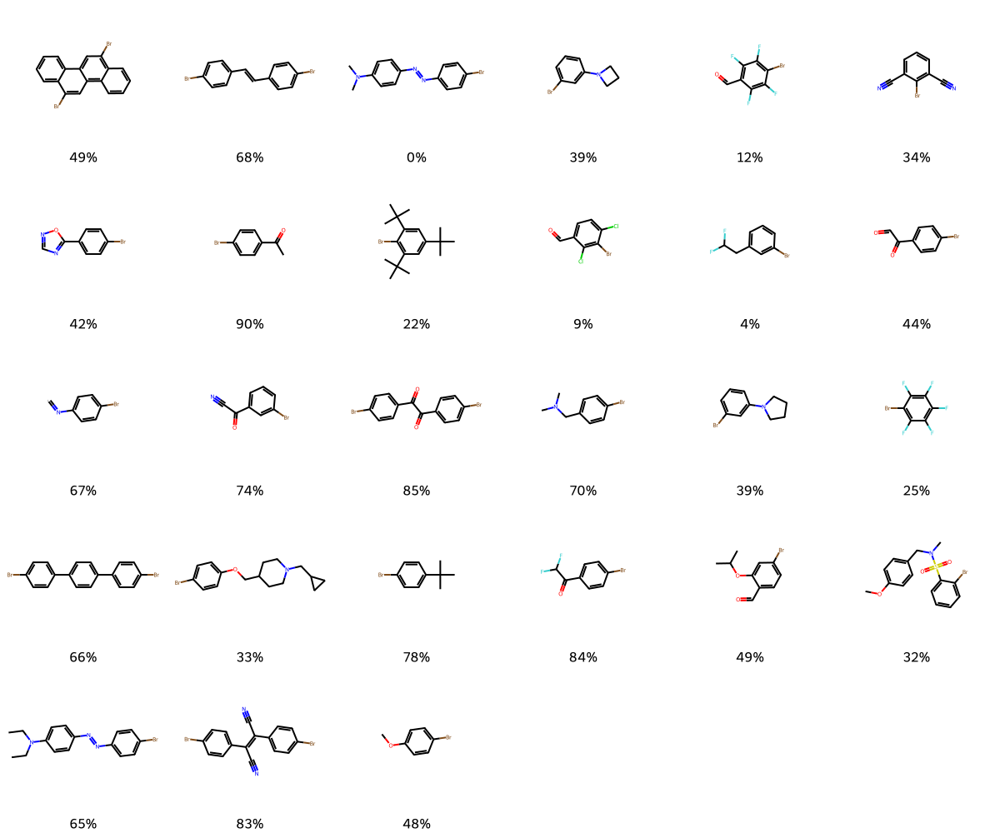

In [13]:
# get the compounds that were selected and the results
results_scopebo = pd.read_csv("./Results_Data/df_scopebo.csv",index_col=0,header=0)
smiles_scopebo = results_scopebo[results_scopebo["yield"] != "PENDING"].index.to_list()
samples_scopebo = {}
for smiles in smiles_scopebo:
    samples_scopebo[smiles] = results_scopebo.loc[smiles,"yield"]
print("Samples in the ScopeBO scope:",len(samples_scopebo))
Draw.MolsToGridImage([Chem.MolFromSmiles(smiles) for smiles in samples_scopebo.keys()],
                     legends=[str(round(float(x)))+"%" for x in samples_scopebo.values()],
                     molsPerRow=6)

UMAP projection of the reaction space:
(Evaluated samples are shown as colored circles.)


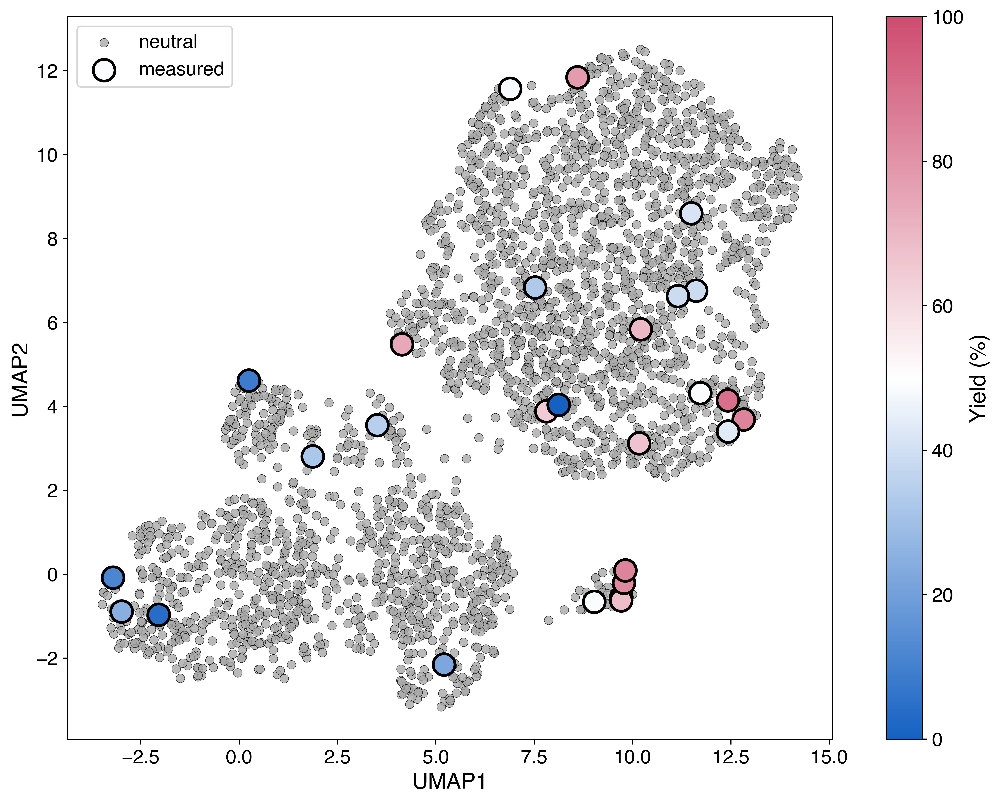

In [14]:
ScopeBO.visualize(filename="./Results_Data/df_scopebo.csv", obj_bounds = (0,100), display_cut_samples=False, display_suggestions=False, display_alternatives=False,
                  draw_structures=False, cbar_title="Yield (%)")

In [15]:
scopebo_avyield = np.mean([float(val) for val in samples_scopebo.values()])
print("Average yield of the ScopeBO scope following the exp. suggestions:",scopebo_avyield)
scopebo_vendi = ScopeBO().get_vendi_score(objectives=["yield"],filename="./Results_Data/df_scopebo.csv")
print("Vendi score of the ScopeBO scope following the exp. suggestions:",scopebo_vendi)
scopebo_scope = Benchmark().calculate_scope_score(obj_score=Benchmark().normalization(scopebo_avyield,bounds=bounds["yield"]),
                                  vendi_score=Benchmark().normalization(scopebo_vendi,bounds=bounds["vendi"]))
print("Scope score of the ScopeBO scope following the exp. suggestions:",scopebo_scope)


Average yield of the ScopeBO scope following the exp. suggestions: 48.459548200030014
Vendi score of the ScopeBO scope following the exp. suggestions: 4.379885389485436
Scope score of the ScopeBO scope following the exp. suggestions: 0.3769104361387546


In [16]:
results_scopebo15 = pd.read_csv("./Results_Data/df_scopebo15.csv",index_col=0,header=0)
smiles_scopebo15 = results_scopebo15[results_scopebo15["yield"] != "PENDING"].index.to_list()
samples_scopebo15 = {}
for smiles in smiles_scopebo15:
    samples_scopebo15[smiles] = results_scopebo15.loc[smiles,"yield"]

In [17]:
scopebo_avyield15 = np.mean([float(val) for val in samples_scopebo15.values()])
print("Average yield of the reduced ScopeBO scope following the exp. suggestions (just 15 samples):",scopebo_avyield15)
scopebo_vendi15 = ScopeBO().get_vendi_score(objectives=["yield"],filename="./Results_Data/df_scopebo15.csv")
print("Vendi score of the reduced ScopeBO scope following the exp. suggestions (just 15 samples):",scopebo_vendi15)
scopebo_scope15 = Benchmark().calculate_scope_score(obj_score=Benchmark().normalization(scopebo_avyield15,bounds=bounds["yield"]),
                                  vendi_score=Benchmark().normalization(scopebo_vendi15,bounds=bounds["vendi"]))
print("Scope score of the reduced ScopeBO scope following the exp. suggestions (just 15 samples):",scopebo_scope15)

Average yield of the reduced ScopeBO scope following the exp. suggestions (just 15 samples): 46.088245285297184
Vendi score of the reduced ScopeBO scope following the exp. suggestions (just 15 samples): 4.171286364427304
Scope score of the reduced ScopeBO scope following the exp. suggestions (just 15 samples): 0.3027132670095282


Analyze the results of the experimental clustering scope

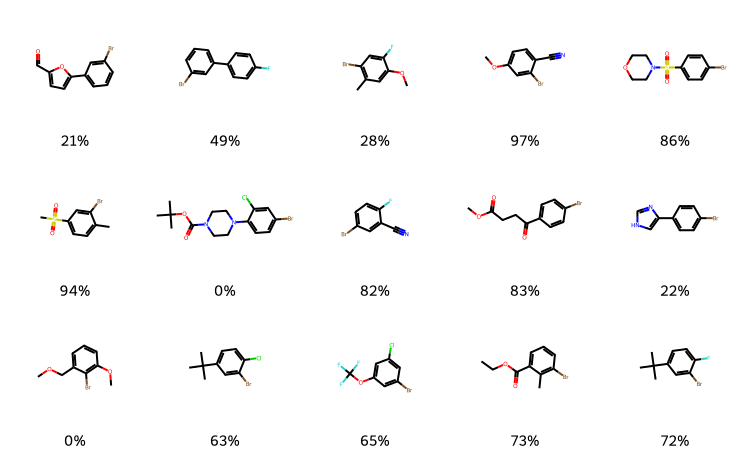

In [18]:
# read the data for the experimental compounds
nmr_yields = pd.read_csv("arbr_nmr_yields.csv",index_col=0,header=0)
# canonicalize smiles
nmr_yields.index = [Chem.MolToSmiles(Chem.MolFromSmiles(x)) for x in nmr_yields.index]
# only keep the results of the clustering scope
clustering_data = nmr_yields[nmr_yields["type"] == "clustering"]

# assign the data
df_clustering = df_labelled.copy()
# remove labels for all compounds not in the clustering scope
df_clustering.loc[~df_clustering.index.isin(clustering_data.index.to_list()),"yield"] = "PENDING"
df_clustering["priority"] = 0  # dummy priority column (needed for UMAP visualization function)
df_clustering.to_csv("./Results_Data/df_clustering.csv",index=True,header=True)  # save the df
# save and draw the samples
samples_clustering = {smiles: df_clustering.loc[smiles,"yield"] for smiles in clustering_data.index}
Draw.MolsToGridImage([Chem.MolFromSmiles(x) for x in samples_clustering.keys()], molsPerRow= 5, subImgSize=(150,150),
                     legends = [str(round(y))+ "%" for y in samples_clustering.values()])


In [19]:
clustering_avyield = np.mean([float(val) for val in samples_clustering.values()])
print("Average yield of the experimentalclustering scope:",clustering_avyield)
clustering_vendi = ScopeBO().get_vendi_score(objectives=["yield"],filename="./Results_Data/df_clustering.csv")
print("Vendi score of the experimental clustering scope:",clustering_vendi)
clustering_scope = Benchmark().calculate_scope_score(obj_score=Benchmark().normalization(clustering_avyield,bounds=bounds["yield"]),
                                  vendi_score=Benchmark().normalization(clustering_vendi,bounds=bounds["vendi"]))
print("Scope score of the experimental clustering scope:",clustering_scope)


Average yield of the experimentalclustering scope: 55.666666666666664
Vendi score of the experimental clustering scope: 1.9928932367749244
Scope score of the experimental clustering scope: 0.07514566580037545


Visualize the experimental clustering scope:
UMAP projection of the reaction space:
(Evaluated samples are shown as colored circles.)


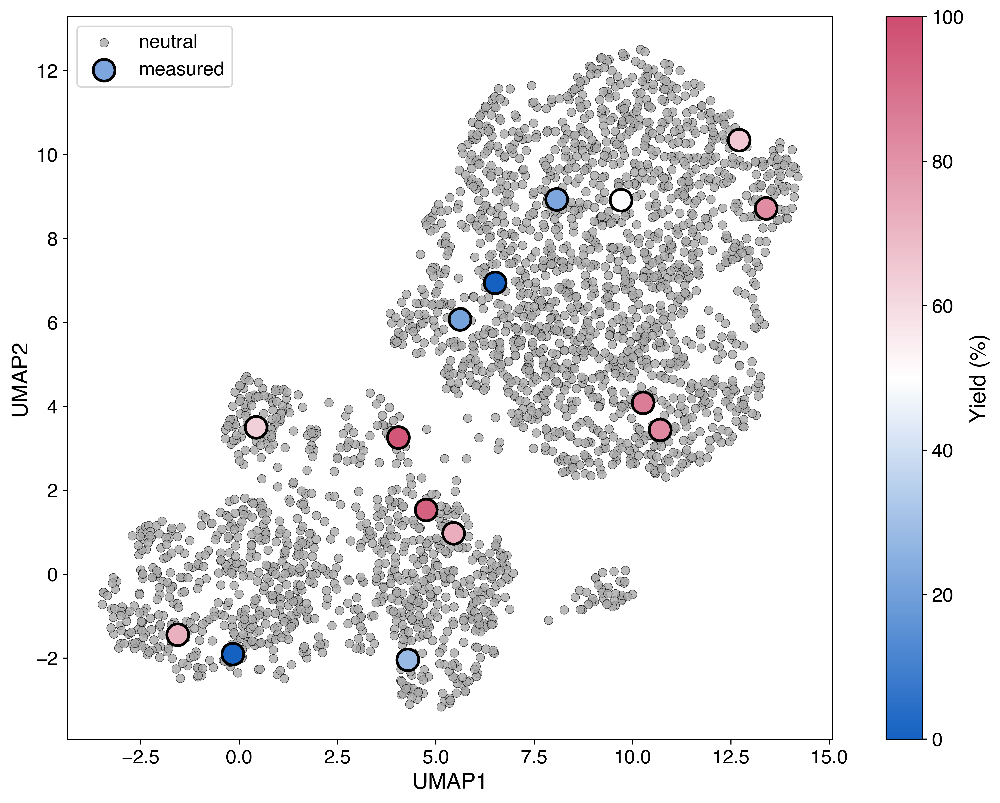

In [20]:
print("Visualize the experimental clustering scope:")
ScopeBO.visualize(filename="./Results_Data/df_clustering.csv", obj_bounds = (0,100), display_cut_samples=False, display_suggestions=False, display_alternatives=False,
                  draw_structures=False, cbar_title="Yield (%)")